In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/silk-dataset/silk_dataset/IMG_3946.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_2771.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_3912.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_3167.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_2760.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_2844.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_2765.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_2711.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_3114.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_2740.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_3538.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_2791.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_3095.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_3520.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_2987.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_3809.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_3030.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_3925.jpg
/kaggle/input/silk-dataset/silk_dataset/IMG_27

K-Means (multi-class) masks will be saved in: /kaggle/working/kmeans_multiclass_masks
Using device: cuda (for K-Means)

Starting multi-class K-Means mask generation...


Generating K-Means Masks: 100%|██████████| 1351/1351 [5:34:47<00:00, 14.87s/it]



Multi-class K-Means mask generation completed. Processed: 1351, Skipped: 0

--- End of K-Means mask generation code ---

--- Visualizing generated multi-class K-Means masks ---


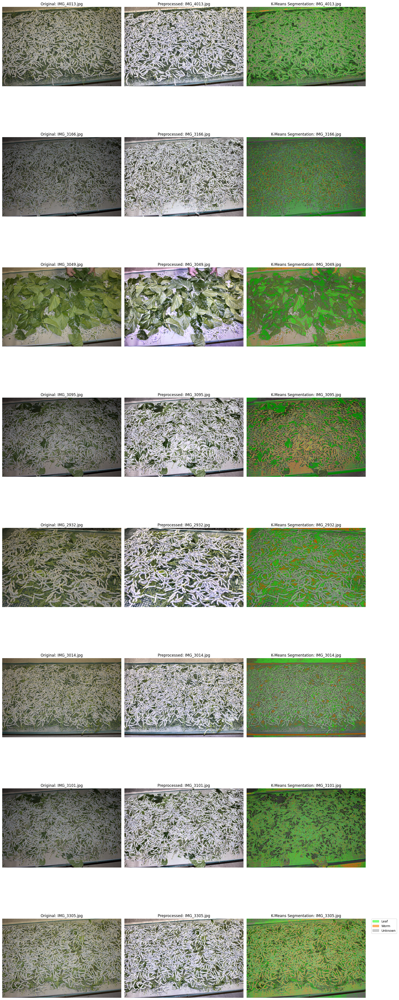


--- End of K-Means generation and visualization process ---


In [ ]:
import os
import cv2
import numpy as np
from PIL import Image
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import pandas as pd
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import math # Added math module

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors # Added for custom colormap
import matplotlib.patches as mpatches # Added for legend patches
import os
from PIL import Image
import random # Added for random image selection
import pandas as pd # Added for reading CSV
import torch # Added for device setup, even if not directly used in K-means itself
import math # Added for math.ceil in visualization


# --- 0. Initial Configuration and Paths ---
IMAGES_INPUT_DIR = '/kaggle/input/silk-dataset/silk_dataset' # Path to the directory containing your input images
OUTPUT_MASKS_DIR = '/kaggle/working/kmeans_multiclass_masks' # Path where the generated K-Means multi-class masks will be saved

os.makedirs(OUTPUT_MASKS_DIR, exist_ok=True) # Create the output directory if it doesn't already exist

print(f"K-Means (multi-class) masks will be saved in: {OUTPUT_MASKS_DIR}")

# Device configuration. K-Means (OpenCV) typically runs on CPU, so we explicitly set it.
device = torch.device("cuda") 
print(f"Using device: {device} (for K-Means)")

# --- Preprocessing Parameters ---
GAMMA = 2.2 # Gamma value for sRGB to linear conversion. Standard for sRGB.
CLAHE_CLIP = 2.0 # Clipping limit for Contrast Limited Adaptive Histogram Equalization (CLAHE).
CLAHE_GRID = (8, 8) # Grid size for CLAHE.
FOURIER_HIGH_PASS_RADIUS = 30 # Radius for the high-pass filter in the frequency domain.

# --- 4. K-Means Clustering Parameters and Classification Logic ---
# Define class IDs. These integers will be the pixel values in the output mask.
BACKGROUND_CLASS_ID = 0
LEAF_CLASS_ID       = 1
WORM_CLASS_ID       = 2
UNKNOWN_CLASS_ID    = 3 # For pixels that don't clearly fall into other categories

K_CLUSTERS = 8 # Number of clusters for K-Means. This value needs to be tuned.
COLOR_SPACE_FOR_KMEANS = 'LAB' # Color space to use for K-Means clustering ('LAB', 'HSV', or 'RGB').


CLUSTER_ID_TO_CLASS = {
    0: LEAF_CLASS_ID,
    1: LEAF_CLASS_ID,
    2: BACKGROUND_CLASS_ID,
    3: LEAF_CLASS_ID,
    4: WORM_CLASS_ID,
    5: BACKGROUND_CLASS_ID,
    6: UNKNOWN_CLASS_ID,
    7: UNKNOWN_CLASS_ID
}

# --- DEFINITION OF CUSTOM COLORS FOR CLASSES  ---
# These RGBA (Red, Green, Blue, Alpha) color values are used for visualizing the masks.
# The alpha channel controls transparency (0.0 is fully transparent, 1.0 is fully opaque).
custom_colors = [
    [0.0, 0.0, 0.0, 0.0],  # Class 0 (BACKGROUND_CLASS_ID): Background (Transparent when overlaid)
    [0.0, 1.0, 0.0, 0.5],  # Class 1 (LEAF_CLASS_ID): Leaf (Green, semi-transparent)
    [1.0, 0.5, 0.0, 0.6],  # Class 2 (WORM_CLASS_ID): Worm (Orange, slightly more opaque)
    [0.5, 0.5, 0.5, 0.4]   # Class 3 (UNKNOWN_CLASS_ID): Unknown (Gray, semi-transparent)
]
custom_cmap = mcolors.ListedColormap(custom_colors) # Create a Matplotlib colormap from the defined colors.

# Class Labels for the Legend 
# This dictionary is used to display human-readable labels in the visualization legend.
CLASS_LABELS_FOR_LEGEND = {
    LEAF_CLASS_ID: "Leaf",
    WORM_CLASS_ID: "Worm",
    UNKNOWN_CLASS_ID: "Unknown"
}


# --- Preprocessing Utilities ---

inverse_gamma = 1.0 / GAMMA # Pre-calculate inverse gamma.

def sRGB_to_linear(image_srgb: np.ndarray) -> np.ndarray:
    
    srgb_norm = image_srgb.astype(np.float32) / 255.0
    return np.power(srgb_norm, GAMMA)

def linear_to_sRGB(image_linear: np.ndarray) -> np.ndarray:
    
    clipped = np.clip(image_linear, 0.0, 1.0)
    srgb_norm = np.power(clipped, inverse_gamma)
    return (srgb_norm * 255).astype(np.uint8)

def normalize_image_brightness(image_srgb: np.ndarray, target_luma: float = 0.35) -> np.ndarray:
    
    linear = sRGB_to_linear(image_srgb)
    luma = 0.2126 * linear[..., 0] + 0.7152 * linear[..., 1] + 0.0722 * linear[..., 2]
    scale = target_luma / (luma.mean() + 1e-6)
    linear_scaled = np.clip(linear * scale, 0.0, 1.0)
    return linear_to_sRGB(linear_scaled)

def apply_gray_world_balance(image_srgb: np.ndarray) -> np.ndarray:
    
    img32 = image_srgb.astype(np.float32)
    avg_channels = img32.mean(axis=(0,1))
    overall_mean = avg_channels.mean()
    scales = overall_mean / (avg_channels + 1e-6)
    balanced = img32 * scales
    return np.clip(balanced, 0, 255).astype(np.uint8)

def high_pass_filter(image_gray: np.ndarray, radius: int = FOURIER_HIGH_PASS_RADIUS) -> np.ndarray:
    
    h, w = image_gray.shape
    cy, cx = h // 2, w // 2
    dft = cv2.dft(image_gray.astype(np.float32), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shifted = np.fft.fftshift(dft)
    mask = np.ones((h, w, 2), np.uint8)
    cv2.circle(mask, (cx, cy), radius, 0, -1) 
    fshift = dft_shifted * mask
    f_ishift = np.fft.ifftshift(fshift)
    back = cv2.idft(f_ishift)
    magnitude = cv2.magnitude(back[..., 0], back[..., 1])
    return cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

def preprocess_image_for_kmeans(image_rgb: np.ndarray) -> np.ndarray:
    
    normed = normalize_image_brightness(image_rgb)
    balanced = apply_gray_world_balance(normed)
    
    lab = cv2.cvtColor(balanced, cv2.COLOR_RGB2LAB) # Convert to LAB color space.
    L, A, B = cv2.split(lab) # Split LAB channels.
    clahe = cv2.createCLAHE(clipLimit=CLAHE_CLIP, tileGridSize=CLAHE_GRID) # Create CLAHE object.
    L_eq = clahe.apply(L) # Apply CLAHE to the Luminance (L) channel.
    contrast_enhanced_rgb = cv2.cvtColor(cv2.merge((L_eq, A, B)), cv2.COLOR_LAB2RGB) # Merge and convert back to RGB.

    gray_contrast = cv2.cvtColor(contrast_enhanced_rgb, cv2.COLOR_RGB2GRAY) # Convert to grayscale for high-pass.
    hp_mask = high_pass_filter(gray_contrast) # Apply high-pass filter.
    # Blend the high-pass filtered result with the contrast-enhanced image.
    enhanced_final_rgb = cv2.addWeighted(contrast_enhanced_rgb, 1.0, cv2.cvtColor(hp_mask, cv2.COLOR_GRAY2RGB), 0.5, 0)

    return enhanced_final_rgb


# --- K-Means Segmentation Function ---
def kmeans_segmentation(image_rgb: np.ndarray, debug_mode: bool = False, run_preprocessing: bool = True) -> tuple:
    
    processed_image_for_kmeans = image_rgb
    if run_preprocessing:
        processed_image_for_kmeans = preprocess_image_for_kmeans(image_rgb)

    # Convert image to the specified color space for K-Means.
    if COLOR_SPACE_FOR_KMEANS == 'LAB':
        img_for_kmeans = cv2.cvtColor(processed_image_for_kmeans, cv2.COLOR_RGB2LAB)
    elif COLOR_SPACE_FOR_KMEANS == 'HSV':
        img_for_kmeans = cv2.cvtColor(processed_image_for_kmeans, cv2.COLOR_RGB2HSV)
    else: # Default to RGB if an invalid color space is specified.
        img_for_kmeans = processed_image_for_kmeans

    # Reshape the image pixels into a 2D array (N_pixels, N_channels) for K-Means.
    pixels = img_for_kmeans.reshape((-1, img_for_kmeans.shape[-1]))
    pixels = np.float32(pixels) # K-Means expects float32 data.

    # Define K-Means criteria: maximum iterations (100) or desired accuracy (0.2 epsilon).
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    flags = cv2.KMEANS_PP_CENTERS # Use K-Means++ for better initial cluster centers.

    # Run K-Means clustering.
    compactness, labels, centers = cv2.kmeans(
        data=pixels,
        K=K_CLUSTERS, # Number of clusters.
        bestLabels=None, # Output labels for each pixel.
        criteria=criteria,
        attempts=10, # Number of times the algorithm is executed with different initial labellings.
        flags=flags
    )

    centers = np.uint8(centers) # Convert cluster centers back to uint8.
    segmented_image_labels = labels.reshape(image_rgb.shape[:2]) # Reshape labels back to image dimensions.

    if debug_mode:
        print(f"\n--- K-Means Debug ({COLOR_SPACE_FOR_KMEANS} space) ---")
        print(f"Cluster Centroids ({COLOR_SPACE_FOR_KMEANS}):")
        for i, center in enumerate(centers):
            # Convert centroid color back to RGB for easier human interpretation.
            if COLOR_SPACE_FOR_KMEANS == 'LAB':
                lab_center = np.array([[center]], dtype=np.uint8)
                rgb_center = cv2.cvtColor(lab_center, cv2.COLOR_LAB2RGB)[0,0]
                print(f"  Cluster {i}: {center} (LAB) -> RGB: {rgb_center}")
            elif COLOR_SPACE_FOR_KMEANS == 'HSV':
                hsv_center = np.array([[center]], dtype=np.uint8)
                rgb_center = cv2.cvtColor(hsv_center, cv2.COLOR_HSV2RGB)[0,0]
                print(f"  Cluster {i}: {center} (HSV) -> RGB: {rgb_center}")
            else:
                print(f"  Cluster {i}: {center} (RGB)")
        print("\n** Remember to update CLUSTER_ID_TO_CLASS based on these colors! **")

    # Initialize the final mask with the UNKNOWN_CLASS_ID.
    final_mask_labels = np.full(image_rgb.shape[:2], fill_value=UNKNOWN_CLASS_ID, dtype=np.uint8)

    # Map each K-Means cluster ID to a predefined class ID (Background, Leaf, Worm, Unknown).
    for cluster_id in range(K_CLUSTERS):
        target_class_id = CLUSTER_ID_TO_CLASS.get(cluster_id, UNKNOWN_CLASS_ID) # Use .get with a default for safety.
        cluster_pixels_mask = (segmented_image_labels == cluster_id) # Create a mask for pixels belonging to this cluster.
        final_mask_labels[cluster_pixels_mask] = target_class_id # Assign the target class ID to these pixels.
            
    # Create binary masks for worms and leaves based on the final_mask_labels.
    worms_mask = (final_mask_labels == WORM_CLASS_ID).astype(np.uint8)
    leaves_mask = (final_mask_labels == LEAF_CLASS_ID).astype(np.uint8)

    return worms_mask, leaves_mask, final_mask_labels, processed_image_for_kmeans


# --- 6. List of Images to Process ---
image_filenames = []
try:
    # Attempt to load image filenames from a CSV file (e.g., '0_data.csv' in the input directory).
    original_csv_path = os.path.join(IMAGES_INPUT_DIR, '0_data.csv')
    original_df = pd.read_csv(original_csv_path)
    image_filenames = [os.path.basename(f) for f in original_df['foto'].tolist()] # Extract filenames from 'foto' column.
except FileNotFoundError:
    print(f"ERROR: Dataset CSV file not found: {original_csv_path}")
    image_filenames = [] # If CSV not found, the list remains empty.

if not image_filenames:
    print("No images found for processing.")


# --- 7. Generate and Save K-Means Masks ---
processed_image_info = [] # List to store information about processed images for later visualization.

if image_filenames: # Proceed only if there are images to process.
    print("\nStarting multi-class K-Means mask generation...")
    processed_count = 0
    skipped_count = 0

    ENABLE_KMEANS_DEBUG = False # Set to True to enable debug mode (prints cluster centroids).
    DEBUG_SAMPLE_SIZE = 8 # Number of images to process in debug mode (useful for quickly checking cluster outputs).

    NUM_DISPLAY_SAMPLES = 8 # Number of final masks to display for visualization.

    if ENABLE_KMEANS_DEBUG:
        print(f"\nK-MEANS DEBUG MODE ACTIVE. Will process {DEBUG_SAMPLE_SIZE} image(s) for debugging.")
        # Select a random sample of images for debugging.
        images_to_process_tqdm = random.sample(image_filenames, min(DEBUG_SAMPLE_SIZE, len(image_filenames)))
    else:
        images_to_process_tqdm = image_filenames # Process all images if debug mode is off.

    # Initialize tqdm for a progress bar during image processing.
    tqdm_iterator = tqdm(images_to_process_tqdm, desc="Generating K-Means Masks")

    for img_filename_base in tqdm_iterator:
        img_path = os.path.join(IMAGES_INPUT_DIR, img_filename_base)

        if not os.path.exists(img_path):
            print(f"Warning: Original image not found, skipping: {img_path}")
            skipped_count += 1
            continue

        try:
            img_pil = Image.open(img_path).convert("RGB") # Open image with PIL and convert to RGB.
            original_image_np = np.array(img_pil) # Convert PIL image to NumPy array.

            # Enable debug mode only for the very first image if ENABLE_KMEANS_DEBUG is True.
            is_first_debug_image = (processed_count == 0 and ENABLE_KMEANS_DEBUG)
            worms_mask, leaves_mask, final_mask_labels, preprocessed_img_np = \
                kmeans_segmentation(original_image_np, debug_mode=is_first_debug_image, run_preprocessing=True)

            # Define the output filename for the generated mask.
            mask_output_filename = f"kmeans_multiclass_{os.path.splitext(img_filename_base)[0]}.png"
            output_mask_path = os.path.join(OUTPUT_MASKS_DIR, mask_output_filename)
            
            # Save the final mask labels as a single-channel PNG image.
            Image.fromarray(final_mask_labels).save(output_mask_path)
            processed_count += 1 # Increment processed count.

            # Store information about the processed image for later visualization.
            processed_image_info.append({
                'original_path': img_path,
                'mask_path': output_mask_path,
                'image_base': img_filename_base,
                'preprocessed_img': preprocessed_img_np # Store the preprocessed image for visualization.
            })

        except Exception as e:
            print(f"Error during K-Means processing of {img_filename_base}: {e}")
            skipped_count += 1
            continue
            
        if ENABLE_KMEANS_DEBUG and processed_count >= DEBUG_SAMPLE_SIZE:
            print("Reached debug sample size. Stopping processing for debug.")
            break # Exit the loop if debug sample size is reached.

    print(f"\nMulti-class K-Means mask generation completed. Processed: {processed_count}, Skipped: {skipped_count}")
else:
    print("\nNo images found for K-Means processing.")

print("\n--- End of K-Means mask generation code ---")


# --- 8. Visualization of Generated Masks with Custom Colors ---
print("\n--- Visualizing generated multi-class K-Means masks ---")

if processed_image_info: # Only proceed if masks were generated.
    # Select a subset of processed images for display.
    num_display_samples_actual = min(NUM_DISPLAY_SAMPLES, len(processed_image_info))
    display_samples = random.sample(processed_image_info, num_display_samples_actual)

    # Calculate number of rows for the subplot grid.
    num_rows = math.ceil(num_display_samples_actual)
    # Create a figure and a grid of subplots (3 columns: Original, Preprocessed, Segmented).
    fig, axes = plt.subplots(num_rows, 3, figsize=(18, 6 * num_rows))

    # If only one row, ensure 'axes' is treated as a 2D array for consistent indexing.
    if num_rows == 1:
        axes = np.array([axes])

    for j, sample_info in enumerate(display_samples):
        original_img_path = sample_info['original_path']
        mask_path = sample_info['mask_path']
        img_base = sample_info['image_base']
        preprocessed_img_np = sample_info['preprocessed_img']

        try:
            original_image_rgb = Image.open(original_img_path).convert('RGB') # Load original image.
            mask_image = Image.open(mask_path).convert('L') # Load the generated mask as grayscale (L mode).

            original_image_np = np.array(original_image_rgb) # Convert to NumPy array.
            mask_np = np.array(mask_image) # Convert mask to NumPy array.

            # Apply the custom colormap to the mask NumPy array to get RGBA colors for visualization.
            colors_map_applied = custom_cmap(mask_np) # custom_cmap is already globally defined.
            
            # Subplot 1: Original Image
            axes[j, 0].imshow(original_image_np)
            axes[j, 0].set_title(f"Original: {img_base}")
            axes[j, 0].axis('off')

            # Subplot 2: Preprocessed Image
            axes[j, 1].imshow(preprocessed_img_np)
            axes[j, 1].set_title(f"Preprocessed: {img_base}")
            axes[j, 1].axis('off')

            # Subplot 3: Segmented Mask Overlayed on Original Image
            axes[j, 2].imshow(original_image_np) # Show original image as background.
            axes[j, 2].imshow(colors_map_applied) # Overlay the colored mask with transparency.
            axes[j, 2].set_title(f"K-Means Segmentation: {img_base}")
            axes[j, 2].axis('off')
            
            # Add a legend to the last segmented subplot to explain the colors.
            if j == num_display_samples_actual - 1: # Only add legend to the last displayed image.
                handles = [mpatches.Patch(color=custom_colors[i], label=CLASS_LABELS_FOR_LEGEND[i])
                           for i in sorted(CLASS_LABELS_FOR_LEGEND.keys())] # Create colored patches for legend.
                axes[j, 2].legend(handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

        except Exception as e:
            print(f"Error during visualization of {img_base}: {e}")
            # Turn off axes and set a simple title to indicate error.
            axes[j, 0].axis('off'); axes[j, 1].axis('off'); axes[j, 2].axis('off')
            axes[j, 0].set_title(f"Error: {img_base}")

    plt.tight_layout() # Adjust subplot parameters for a tight layout.
    plt.show() # Display the plots.
else:
    print("No multi-class K-Means masks generated for visualization.")

print("\n--- End of K-Means generation and visualization process ---")

In [3]:
KMEANS_MASKS_DIR = '/kaggle/working/kmeans_multiclass_masks'

# Definisci il nome del file ZIP di output
# Verrà salvato nella directory /kaggle/working/
KMEANS_ZIP_FILE_PATH = '/kaggle/working/kmeans_multiclass_masks.zip'

print(f"Zipping the folder: {KMEANS_MASKS_DIR} in {KMEANS_ZIP_FILE_PATH}...")

!zip -r {KMEANS_ZIP_FILE_PATH} {KMEANS_MASKS_DIR}

print("Complete!")
print(f"File ZIP '{KMEANS_ZIP_FILE_PATH}' created.")

Zipping the folder: /kaggle/working/kmeans_multiclass_masks in /kaggle/working/kmeans_multiclass_masks.zip...
  adding: kaggle/working/kmeans_multiclass_masks/ (stored 0%)
  adding: kaggle/working/kmeans_multiclass_masks/kmeans_multiclass_IMG_3141.png (deflated 0%)
  adding: kaggle/working/kmeans_multiclass_masks/kmeans_multiclass_IMG_3426.png (deflated 0%)
  adding: kaggle/working/kmeans_multiclass_masks/kmeans_multiclass_IMG_3620.png (deflated 0%)
  adding: kaggle/working/kmeans_multiclass_masks/kmeans_multiclass_IMG_2818.png (deflated 0%)
  adding: kaggle/working/kmeans_multiclass_masks/kmeans_multiclass_IMG_3285.png (deflated 0%)
  adding: kaggle/working/kmeans_multiclass_masks/kmeans_multiclass_IMG_3907.png (deflated 0%)
  adding: kaggle/working/kmeans_multiclass_masks/kmeans_multiclass_IMG_3465.png (deflated 0%)
  adding: kaggle/working/kmeans_multiclass_masks/kmeans_multiclass_IMG_3627.png (deflated 0%)
  adding: kaggle/working/kmeans_multiclass_masks/kmeans_multiclass_IMG_3161.